In [8]:
# Step 1: Install rasterio (run this in the terminal)
!pip install rasterio

# Step 2: Import necessary modules
from PIL import Image
import os
import rasterio
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage import io, transform, exposure, feature, measure, morphology
from pyproj import Transformer

from rasterio.transform import xy



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


File: id10_aglar.tif, Dimensions: 99 x 99, Bands: 3


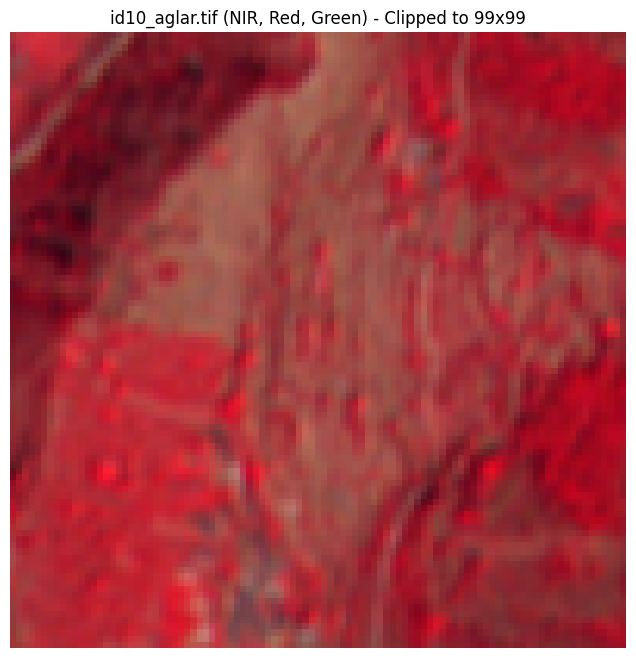

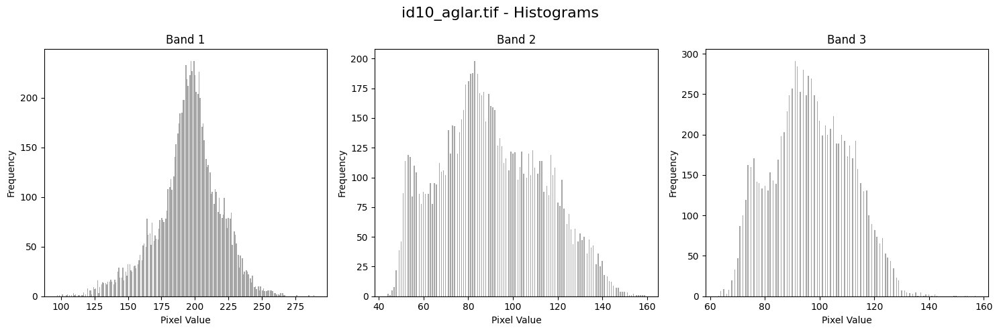

File: id6_aglar.tif, Dimensions: 99 x 99, Bands: 3


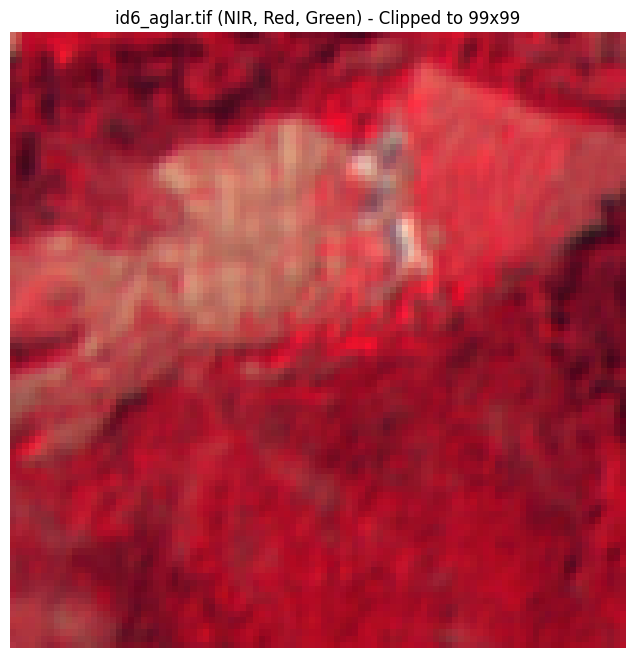

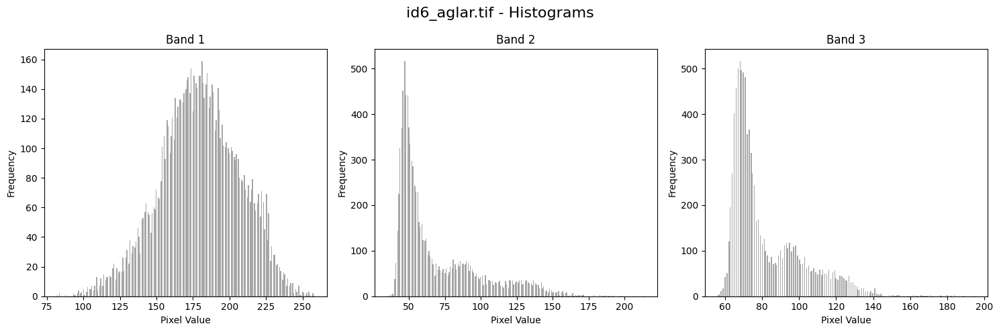

File: id7_aglar.tif, Dimensions: 99 x 99, Bands: 3


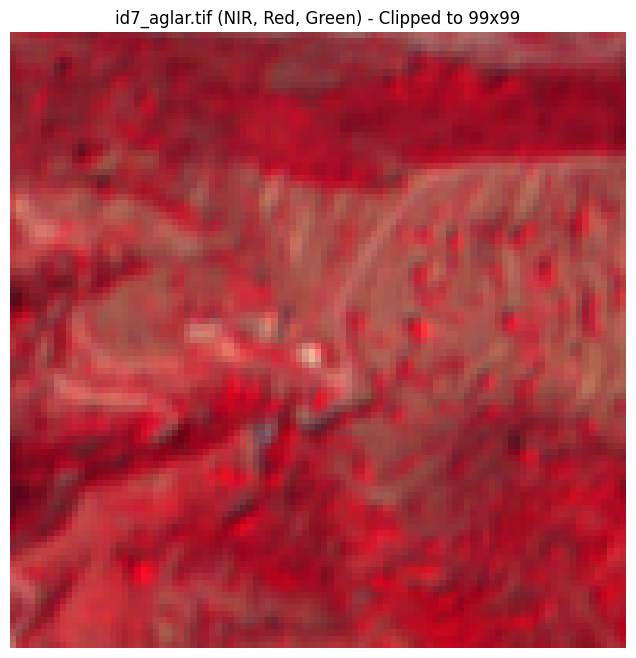

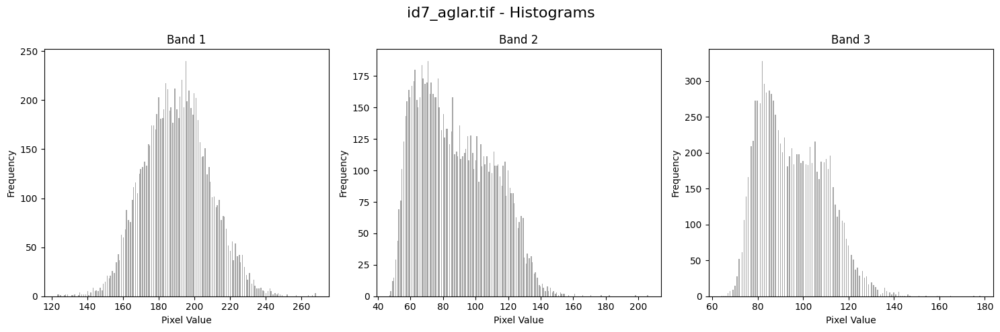

File: id8_aglar.tif, Dimensions: 99 x 99, Bands: 3


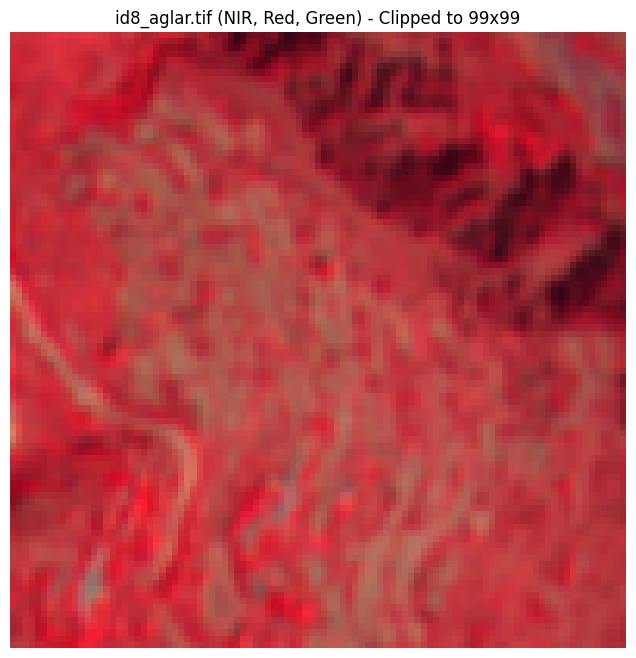

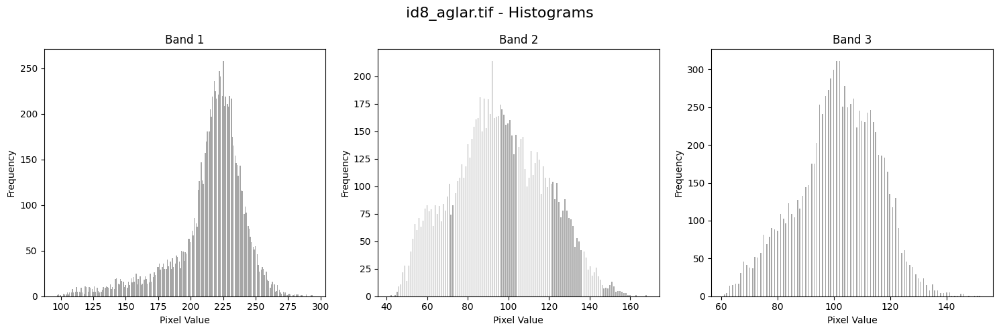

File: id9_aglar.tif, Dimensions: 99 x 99, Bands: 3


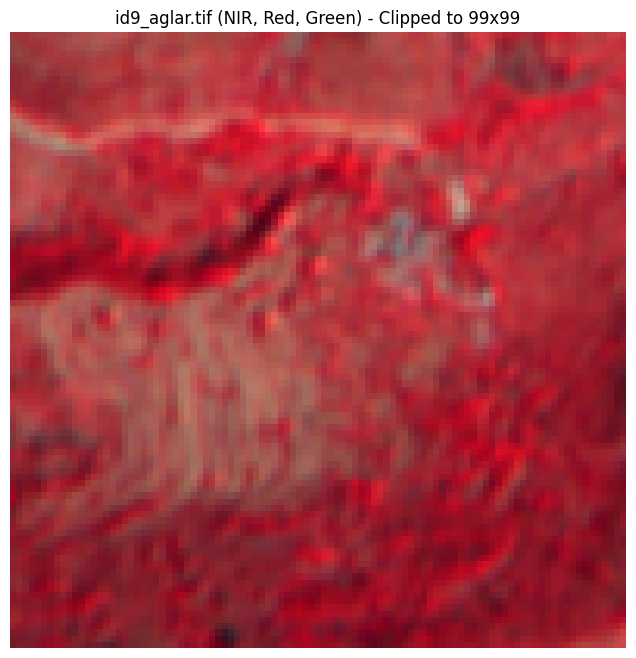

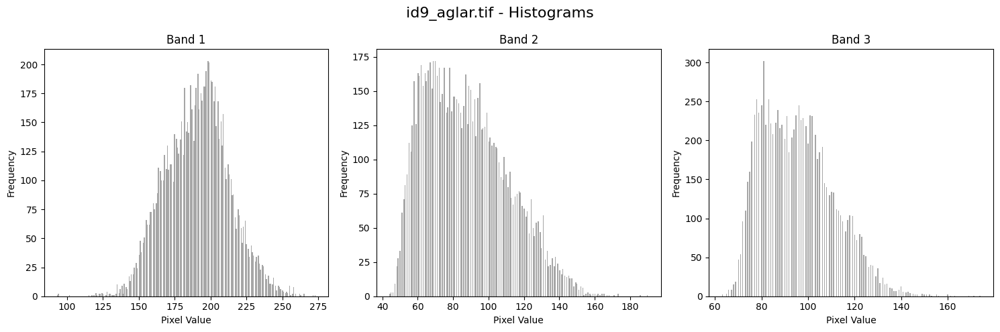

In [9]:
# Define the path to the "Terrace Template" folder
folder_path = r'C:\Users\rushi\Documents\BTP2 Downloads\Terrace Template'

# List all .tif files in the folder, excluding those with IDs 1, 2, 3, 4, and 5
excluded_ids = {'1', '2', '3', '4', '5'}
tif_files = [f for f in os.listdir(folder_path) if f.endswith('.tif') and f.split('_')[0][2:] not in excluded_ids]

# Define the desired size for clipping
clip_size = (99, 99)

# Plot the images and print their dimensions
for tif_file in tif_files:
    file_path = os.path.join(folder_path, tif_file)
    with rasterio.open(file_path) as dataset:
        width = dataset.width
        height = dataset.height
        num_bands = dataset.count
        print(f"File: {tif_file}, Dimensions: {width} x {height}, Bands: {num_bands}")
        
        # Read all bands
        bands = [dataset.read(i) for i in range(1, num_bands + 1)]
        
        # Clip the bands to the desired size
        clipped_bands = [band[:clip_size[0], :clip_size[1]] for band in bands]
        
        # Stack bands to create an RGB image (NIR, Red, Green)
        rgb_image = np.dstack(clipped_bands)
        
        # Normalize the image for display
        rgb_image = (rgb_image - rgb_image.min()) / (rgb_image.max() - rgb_image.min())
        
        # Plot the combined RGB image
        plt.figure(figsize=(8, 8))
        plt.imshow(rgb_image)
        plt.title(f"{tif_file} (NIR, Red, Green) - Clipped to {clip_size[0]}x{clip_size[1]}")
        plt.axis('off')  # Hide the axis
        plt.show()
        
        # Plot histograms for each band
        fig, axes = plt.subplots(1, num_bands, figsize=(15, 5))
        fig.suptitle(f"{tif_file} - Histograms", fontsize=16)
        
        for i in range(num_bands):
            band = clipped_bands[i]
            band = band[band != 65536]  # Remove values equal to 65536
            ax = axes[i] if num_bands > 1 else axes
            ax.hist(band.ravel(), bins=256, color='gray', alpha=0.7)
            ax.set_title(f'Band {i+1}')
            ax.set_xlabel('Pixel Value')
            ax.set_ylabel('Frequency')
        
        plt.tight_layout()
        plt.show()

Image 1 shape: (3918, 5673, 3)
Image 1 Band 1 data range: min=51, max=65536
Image 1 Band 1 data type: uint32
Image 1 Band 2 data range: min=20, max=65536
Image 1 Band 2 data type: uint32
Image 1 Band 3 data range: min=37, max=65536
Image 1 Band 3 data type: uint32
Image 2 shape: (213, 327, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


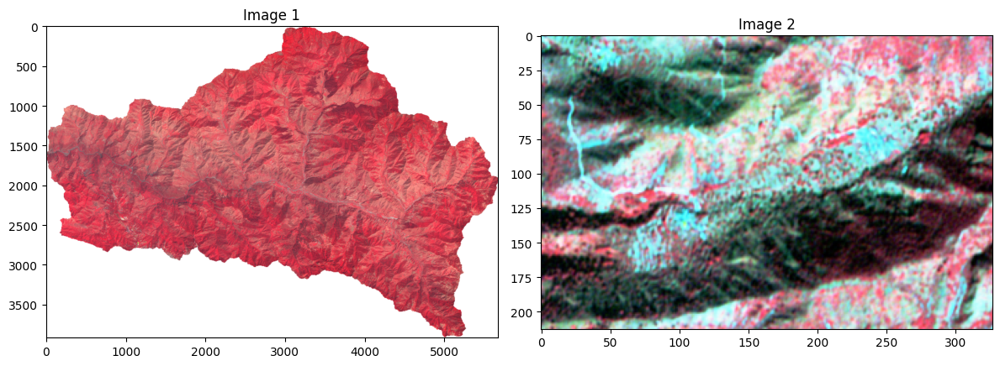

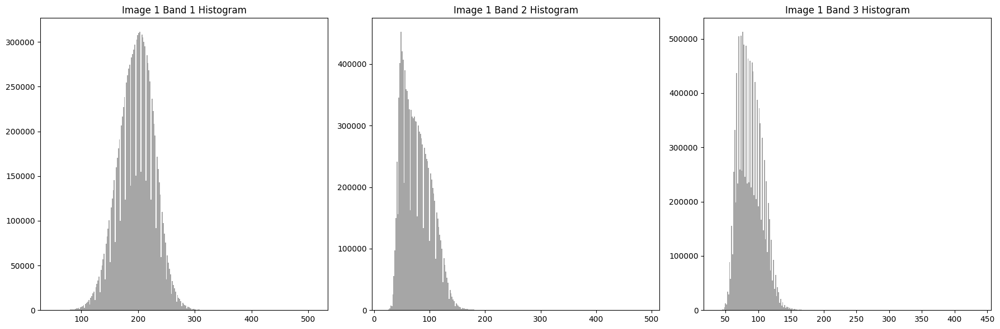

In [10]:
# Function to apply histogram equalization
def equalize_histogram(img_array):
    img_array_eq = np.zeros_like(img_array, dtype=np.float32)
    for i in range(img_array.shape[2]):
        band = img_array[:, :, i]
        band = np.nan_to_num(band, nan=0.0)  # Replace NaN values with 0
        img_array_eq[:, :, i] = exposure.equalize_hist(band)
    return img_array_eq


# Define the image paths
img_path1 = r'C:\Users\rushi\Documents\BTP2 Downloads\15april2017_clip.img'
# img_path1 = r'C:\Users\rushi\Documents\BTP2 Downloads\Sentinel\Sentinel2_Red_Green_Blue_Masked_Export_Summer.tif'
# img_path1 = r'C:\Users\rushi\Documents\BTP2 Downloads\Sentinel\Sentinel2_NIR_Red_Green_Masked_Export_Summer.tif'

# img_path1 = r'C:\Users\rushi\Documents\BTP2 Downloads\testterrace1_resized.jpg'
# img_path1 = r'C:\Users\rushi\Documents\BTP2 Downloads\extracted_image_zoomedin.img'

# img_path2 = r'C:\Users\rushi\Documents\BTP2 Downloads\24oct2017_clip.img'
img_path2 = r'C:\Users\rushi\Documents\BTP2 Downloads\extracted_image_zoomedin.img'

# Open the .img files and read the image data
with rasterio.open(img_path1) as dataset1:
    img_array1 = np.dstack([dataset1.read(i) for i in range(1, 4)])  # Read and stack the first 3 bands
    print(f"Image 1 shape: {img_array1.shape}")  # Debug print
    # img_array1 = equalize_histogram(img_array1)  # Apply histogram equalization

     # Print the range of data for each band in image 1
    for i in range(img_array1.shape[2]):
        band = img_array1[:, :, i]
        print(f"Image 1 Band {i+1} data range: min={band.min()}, max={band.max()}")
        print(f"Image 1 Band {i+1} data type: {band.dtype}")

with rasterio.open(img_path2) as dataset2:
    img_array2 = np.dstack([dataset2.read(i) for i in range(1, 4)])  # Read and stack the first 3 bands
    print(f"Image 2 shape: {img_array2.shape}")  # Debug print
    img_array2 = equalize_histogram(img_array2)  # Apply histogram equalization

# Plot the images using subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # Create a figure with 1 row and 2 columns

# Plot the first image
axes[0].imshow(img_array1)  # Plot the equalized RGB image
# axes[0].axis('off')  # Hide the axis
axes[0].set_title('Image 1')

# Plot the second image
axes[1].imshow(img_array2)  # Plot the equalized RGB image
# axes[1].axis('off')  # Hide the axis
axes[1].set_title('Image 2')

# Show the plot
plt.tight_layout()
plt.show()

# Plot histograms for each band in image 1
fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # Create a figure with 1 row and 3 columns
for i in range(img_array1.shape[2]):
    band = img_array1[:, :, i]
    band = band[band != 65536]  # Remove values equal to 65536
    axes[i].hist(band.ravel(), bins=256, color='gray', alpha=0.7)
    axes[i].set_title(f'Image 1 Band {i+1} Histogram')
plt.tight_layout()
plt.show()

In [ ]:
from skimage.color import rgb2gray

# Function to apply Canny edge detection on a grayscale image
def detect_edges(img_array):
    # Convert the image to grayscale
    gray_img = rgb2gray(img_array)
    # Apply Canny edge detection
    edges = feature.canny(gray_img)
    return edges

# Apply Canny edge detection
edges = detect_edges(img_array1)

# Debugging: Check the range of values in the edges array
print(f"Min value in edges: {np.min(edges)}")
print(f"Max value in edges: {np.max(edges)}")

# Plot the edges
plt.figure(figsize=(6, 6))
plt.imshow(edges, cmap='gray')
plt.axis('off')
plt.title('Detected Edges')
plt.show()

In [ ]:
# Ensure img_array1 is of type uint8
img_array1 = img_array1.astype(np.uint8)

# Convert edges to uint8 type for contour detection
edges_uint8 = (edges * 255).astype(np.uint8)

# Find contours
contours, _ = cv2.findContours(edges_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image with neon green color
img_with_contours = img_array1.copy()
cv2.drawContours(img_with_contours, contours, -1, (57, 255, 20), 10)

# Convert the image from BGR to RGB format
img_with_contours_rgb = cv2.cvtColor(img_with_contours, cv2.COLOR_BGR2RGB)

# Plot the original image with contours
plt.figure(figsize=(6, 6))
plt.imshow(img_with_contours_rgb)
plt.axis('off')
plt.title('Terraces Outlined')
plt.show()

T1: 10, T2: 50, Min ET: 50, Max ET: 100, WS: 15, Area: 12234150 pixels
T1: 10, T2: 50, Min ET: 50, Max ET: 100, WS: 25, Area: 99375 pixels
T1: 10, T2: 50, Min ET: 50, Max ET: 150, WS: 15, Area: 12258000 pixels
T1: 10, T2: 50, Min ET: 50, Max ET: 150, WS: 25, Area: 181250 pixels


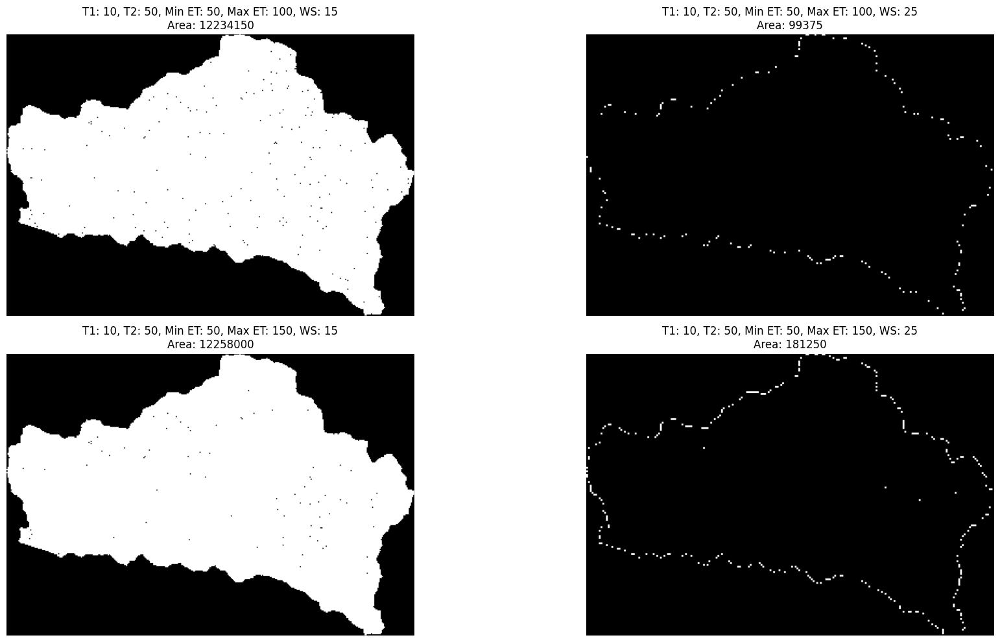

T1: 10, T2: 50, Min ET: 50, Max ET: 200, WS: 15, Area: 12258000 pixels
T1: 10, T2: 50, Min ET: 50, Max ET: 200, WS: 25, Area: 2602500 pixels
T1: 10, T2: 50, Min ET: 50, Max ET: 400, WS: 25, Area: 12420625 pixels
T1: 10, T2: 50, Min ET: 50, Max ET: 600, WS: 25, Area: 12420625 pixels


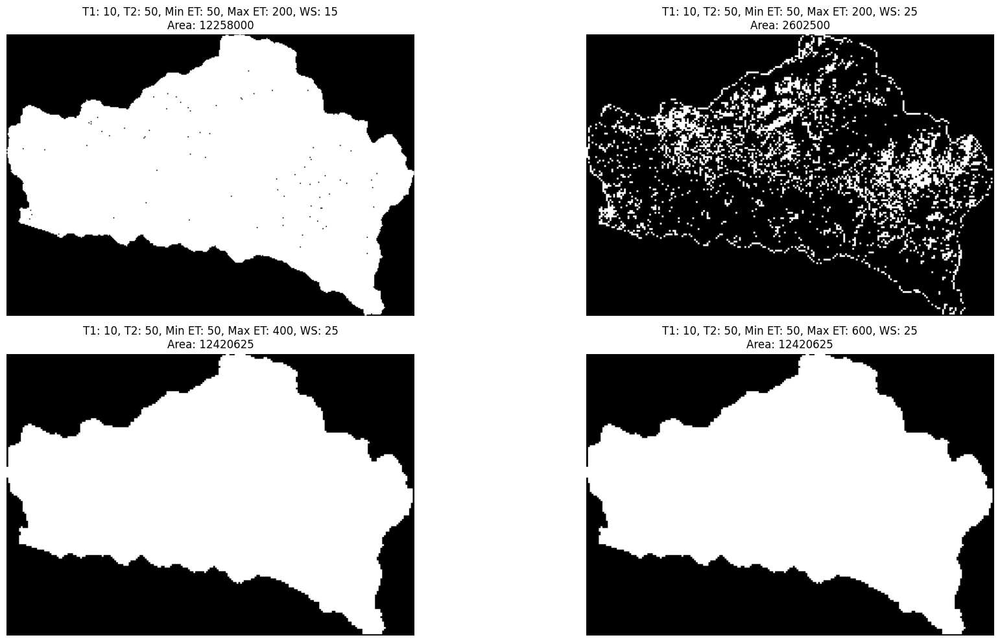

T1: 10, T2: 50, Min ET: 100, Max ET: 150, WS: 15, Area: 13500 pixels
T1: 10, T2: 50, Min ET: 100, Max ET: 150, WS: 25, Area: 81250 pixels
T1: 10, T2: 50, Min ET: 100, Max ET: 200, WS: 15, Area: 13500 pixels
T1: 10, T2: 50, Min ET: 100, Max ET: 200, WS: 25, Area: 2502500 pixels


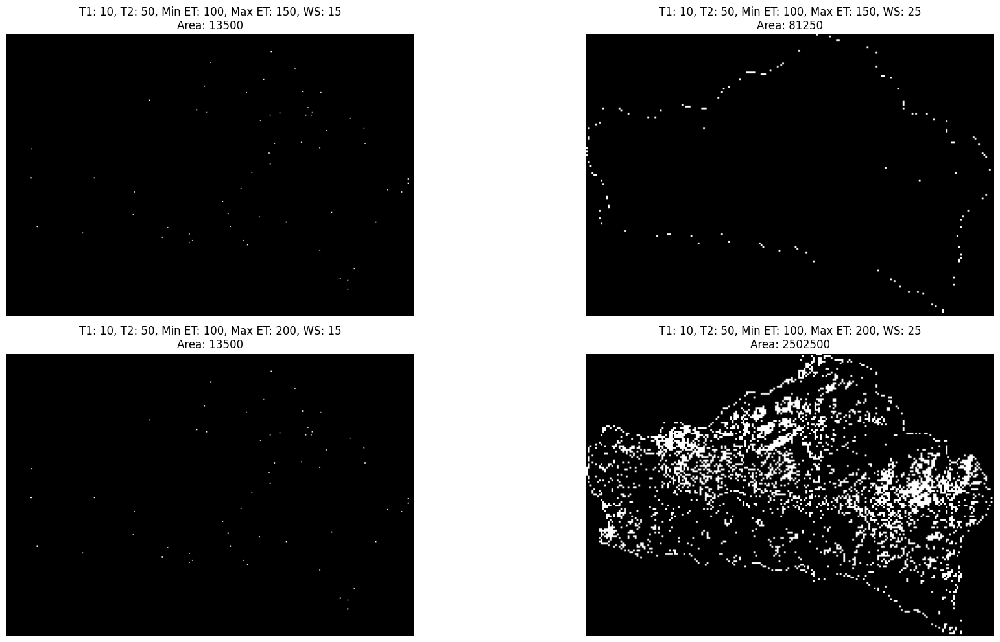

T1: 10, T2: 50, Min ET: 100, Max ET: 400, WS: 25, Area: 12320625 pixels
T1: 10, T2: 50, Min ET: 100, Max ET: 600, WS: 25, Area: 12320625 pixels
T1: 10, T2: 50, Min ET: 200, Max ET: 400, WS: 25, Area: 9664375 pixels
T1: 10, T2: 50, Min ET: 200, Max ET: 600, WS: 25, Area: 9664375 pixels


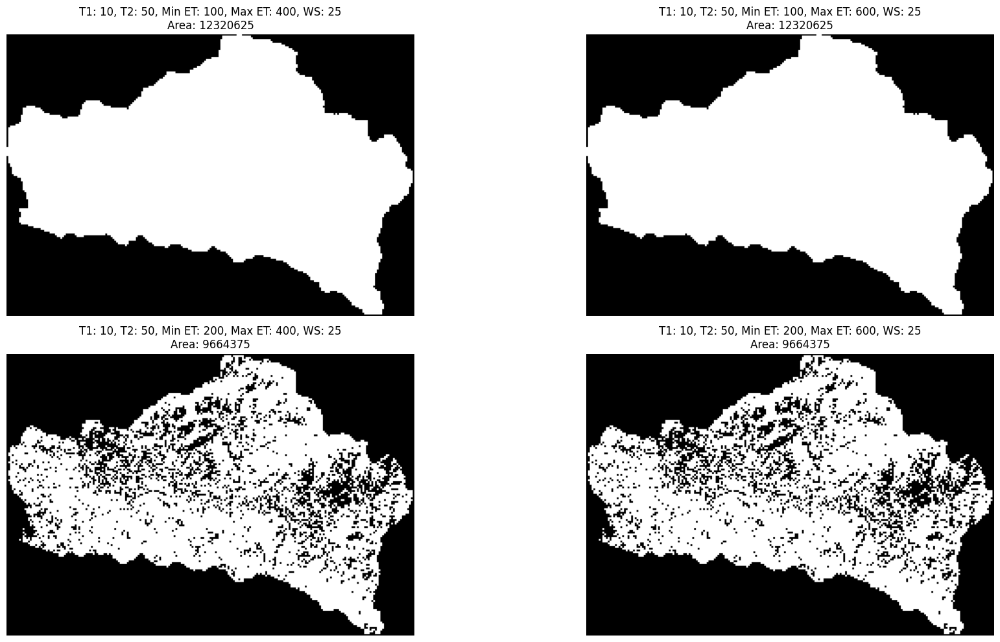

T1: 10, T2: 50, Min ET: 300, Max ET: 400, WS: 25, Area: 0 pixels
T1: 10, T2: 50, Min ET: 300, Max ET: 600, WS: 25, Area: 0 pixels
T1: 10, T2: 150, Min ET: 50, Max ET: 100, WS: 15, Area: 10300275 pixels
T1: 10, T2: 150, Min ET: 50, Max ET: 100, WS: 25, Area: 495000 pixels


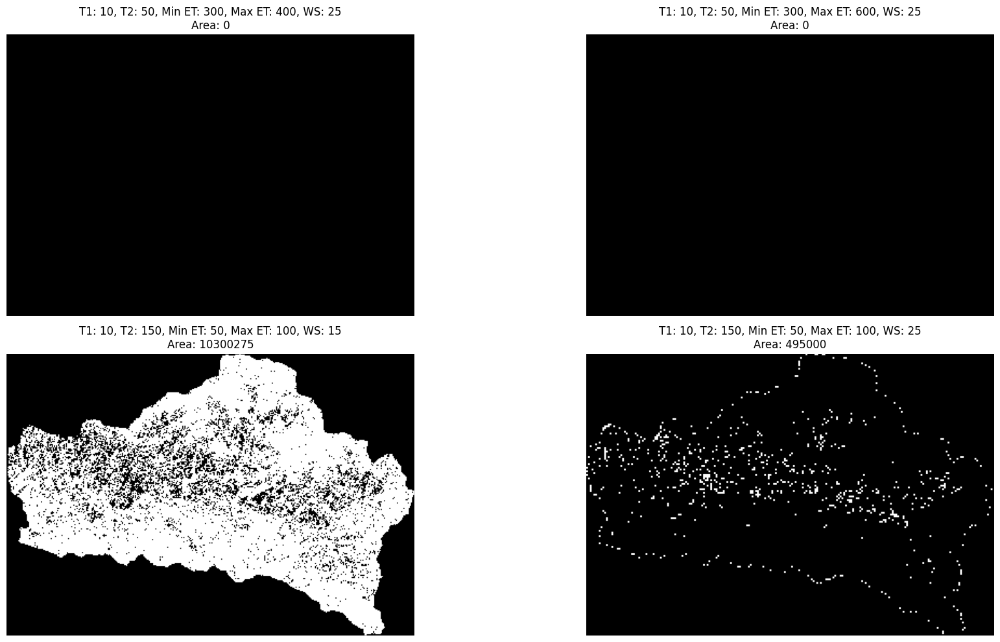

T1: 10, T2: 150, Min ET: 50, Max ET: 150, WS: 15, Area: 10316700 pixels
T1: 10, T2: 150, Min ET: 50, Max ET: 150, WS: 25, Area: 2175000 pixels
T1: 10, T2: 150, Min ET: 50, Max ET: 200, WS: 15, Area: 10316700 pixels
T1: 10, T2: 150, Min ET: 50, Max ET: 200, WS: 25, Area: 7288750 pixels


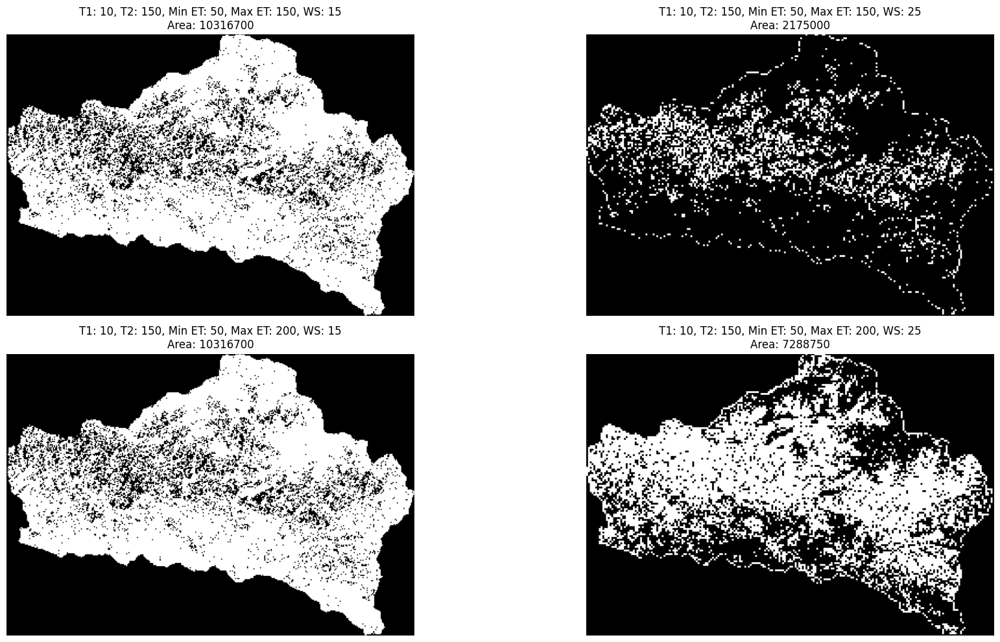

T1: 10, T2: 150, Min ET: 50, Max ET: 400, WS: 25, Area: 12306875 pixels
T1: 10, T2: 150, Min ET: 50, Max ET: 600, WS: 25, Area: 12306875 pixels
T1: 10, T2: 150, Min ET: 100, Max ET: 150, WS: 15, Area: 9900 pixels
T1: 10, T2: 150, Min ET: 100, Max ET: 150, WS: 25, Area: 1660625 pixels


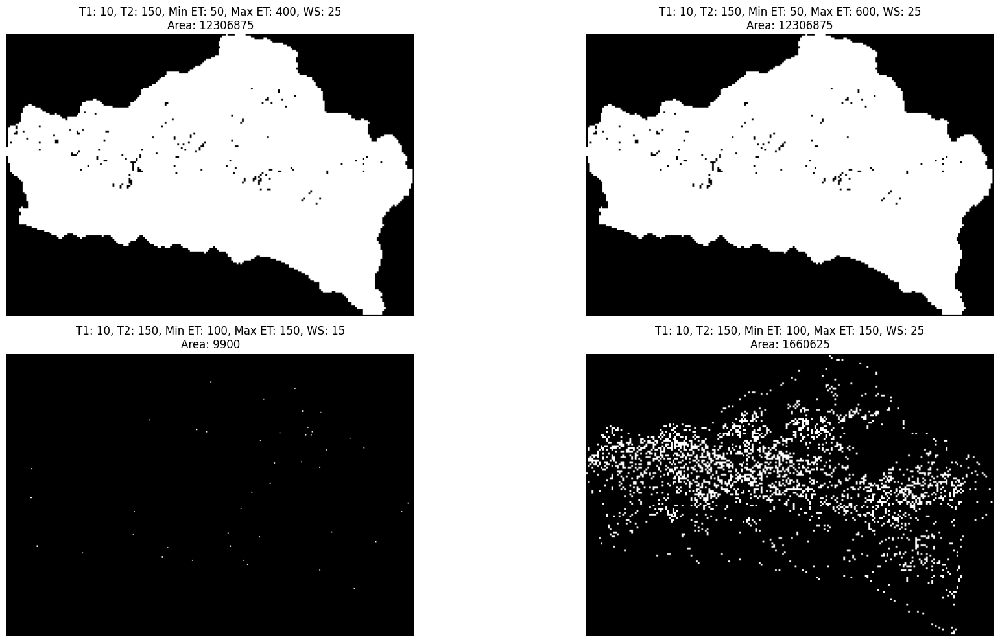

T1: 10, T2: 150, Min ET: 100, Max ET: 200, WS: 15, Area: 9900 pixels
T1: 10, T2: 150, Min ET: 100, Max ET: 200, WS: 25, Area: 6774375 pixels
T1: 10, T2: 150, Min ET: 100, Max ET: 400, WS: 25, Area: 11792500 pixels
T1: 10, T2: 150, Min ET: 100, Max ET: 600, WS: 25, Area: 11792500 pixels


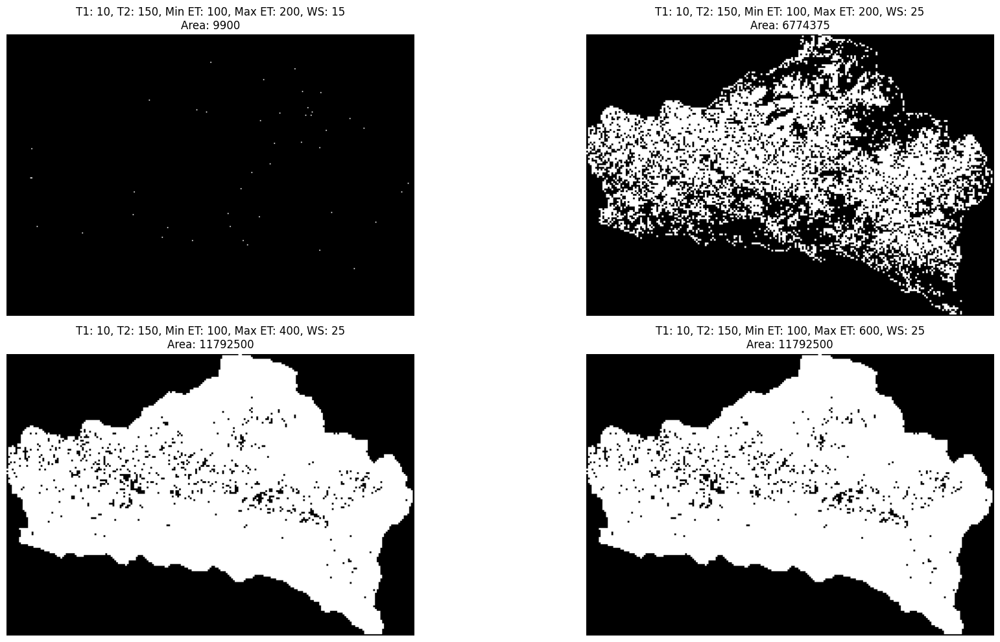

T1: 10, T2: 150, Min ET: 200, Max ET: 400, WS: 25, Area: 4880625 pixels
T1: 10, T2: 150, Min ET: 200, Max ET: 600, WS: 25, Area: 4880625 pixels
T1: 10, T2: 150, Min ET: 300, Max ET: 400, WS: 25, Area: 0 pixels
T1: 10, T2: 150, Min ET: 300, Max ET: 600, WS: 25, Area: 0 pixels


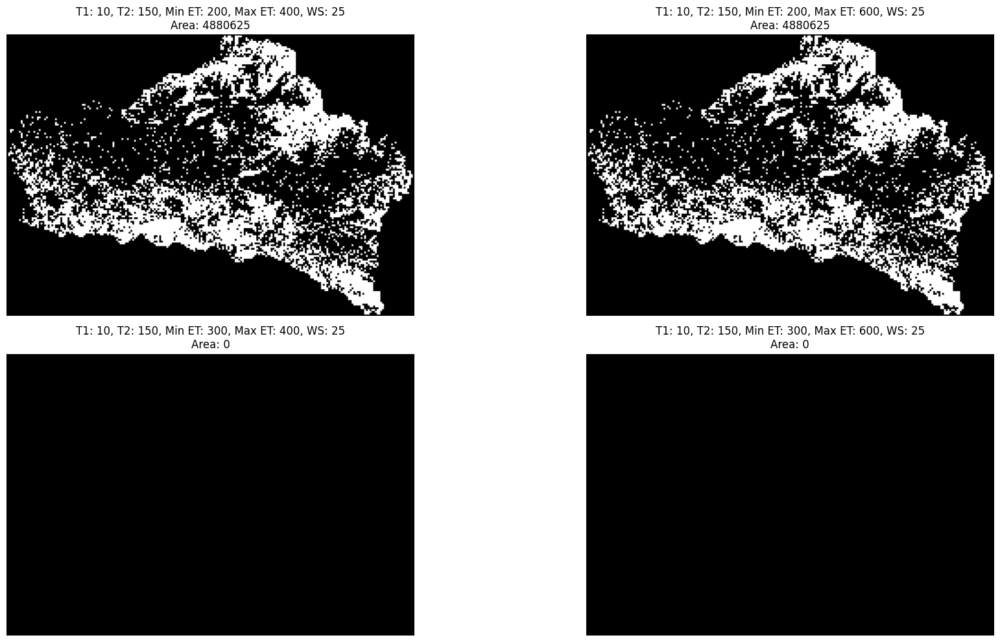

T1: 10, T2: 250, Min ET: 50, Max ET: 100, WS: 15, Area: 7049475 pixels
T1: 10, T2: 250, Min ET: 50, Max ET: 100, WS: 25, Area: 1691875 pixels
T1: 10, T2: 250, Min ET: 50, Max ET: 150, WS: 15, Area: 7060950 pixels
T1: 10, T2: 250, Min ET: 50, Max ET: 150, WS: 25, Area: 4442500 pixels


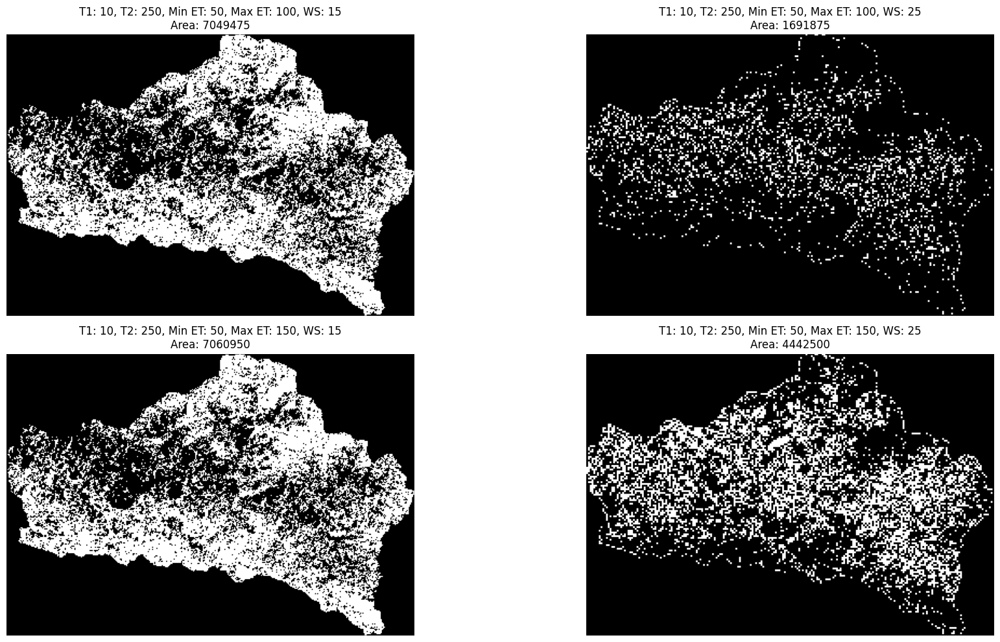

T1: 10, T2: 250, Min ET: 50, Max ET: 200, WS: 15, Area: 7060950 pixels
T1: 10, T2: 250, Min ET: 50, Max ET: 200, WS: 25, Area: 8295000 pixels
T1: 10, T2: 250, Min ET: 50, Max ET: 400, WS: 25, Area: 10858125 pixels
T1: 10, T2: 250, Min ET: 50, Max ET: 600, WS: 25, Area: 10858125 pixels


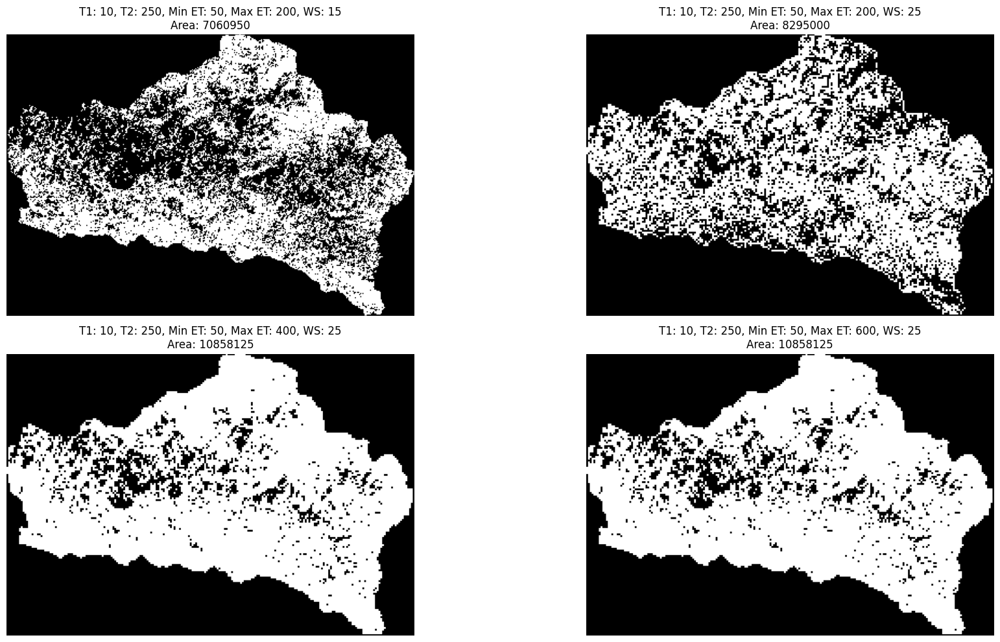

T1: 10, T2: 250, Min ET: 100, Max ET: 150, WS: 15, Area: 5175 pixels
T1: 10, T2: 250, Min ET: 100, Max ET: 150, WS: 25, Area: 2701250 pixels
T1: 10, T2: 250, Min ET: 100, Max ET: 200, WS: 15, Area: 5175 pixels
T1: 10, T2: 250, Min ET: 100, Max ET: 200, WS: 25, Area: 6553750 pixels


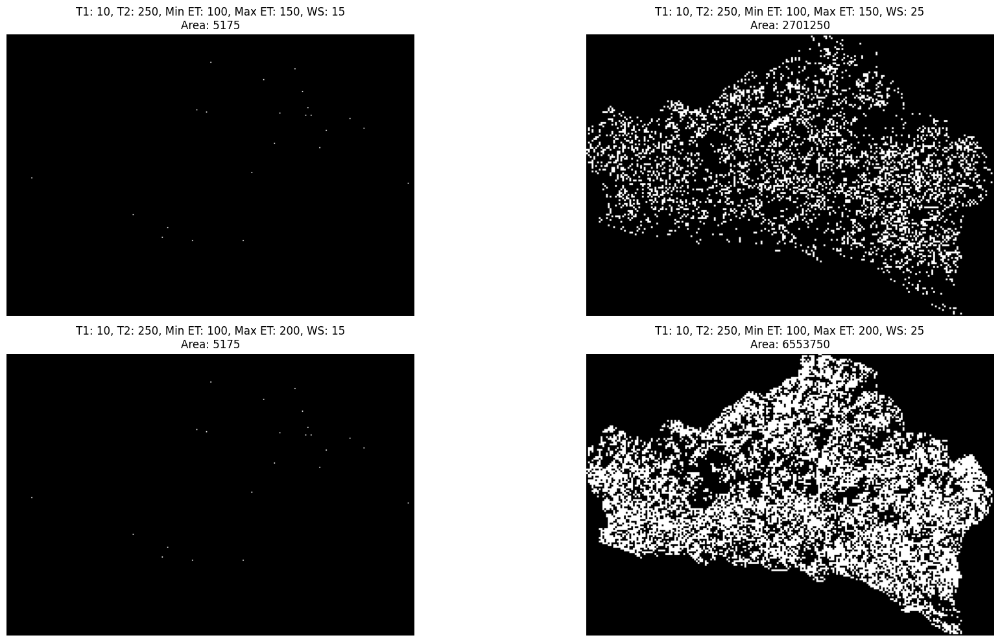

T1: 10, T2: 250, Min ET: 100, Max ET: 400, WS: 25, Area: 9116875 pixels
T1: 10, T2: 250, Min ET: 100, Max ET: 600, WS: 25, Area: 9116875 pixels
T1: 10, T2: 250, Min ET: 200, Max ET: 400, WS: 25, Area: 2484375 pixels
T1: 10, T2: 250, Min ET: 200, Max ET: 600, WS: 25, Area: 2484375 pixels


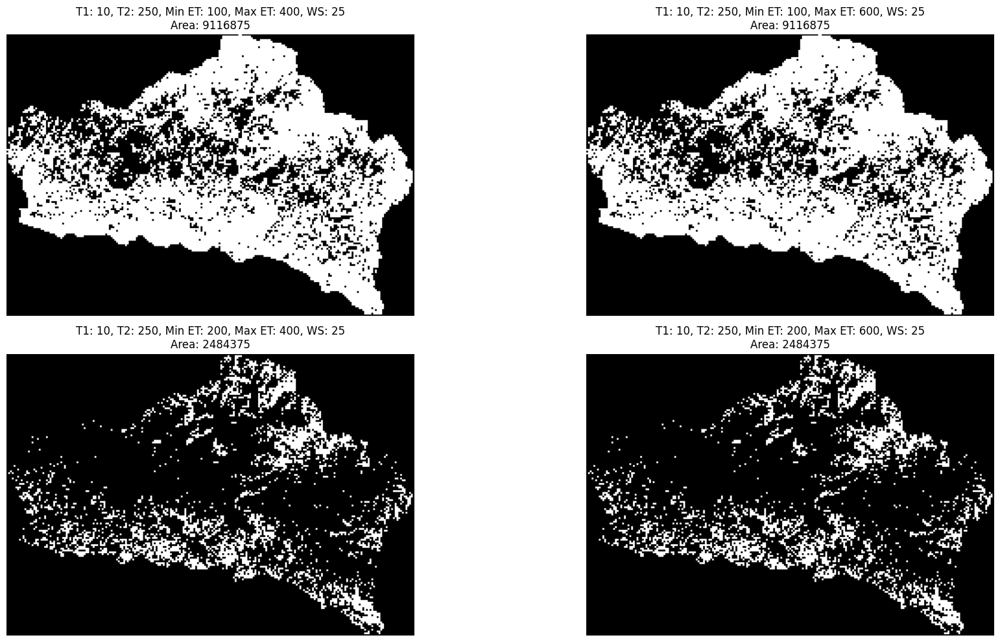

T1: 10, T2: 250, Min ET: 300, Max ET: 400, WS: 25, Area: 0 pixels
T1: 10, T2: 250, Min ET: 300, Max ET: 600, WS: 25, Area: 0 pixels
T1: 10, T2: 350, Min ET: 50, Max ET: 100, WS: 15, Area: 4828950 pixels
T1: 10, T2: 350, Min ET: 50, Max ET: 100, WS: 25, Area: 2092500 pixels


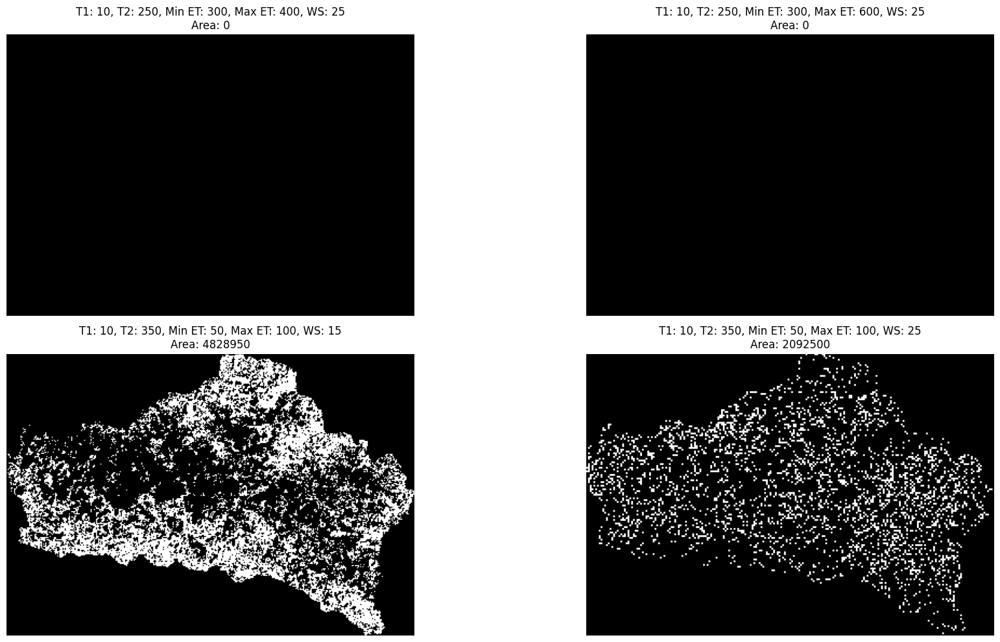

T1: 10, T2: 350, Min ET: 50, Max ET: 150, WS: 15, Area: 4839750 pixels
T1: 10, T2: 350, Min ET: 50, Max ET: 150, WS: 25, Area: 4623750 pixels
T1: 10, T2: 350, Min ET: 50, Max ET: 200, WS: 15, Area: 4839750 pixels
T1: 10, T2: 350, Min ET: 50, Max ET: 200, WS: 25, Area: 7186875 pixels


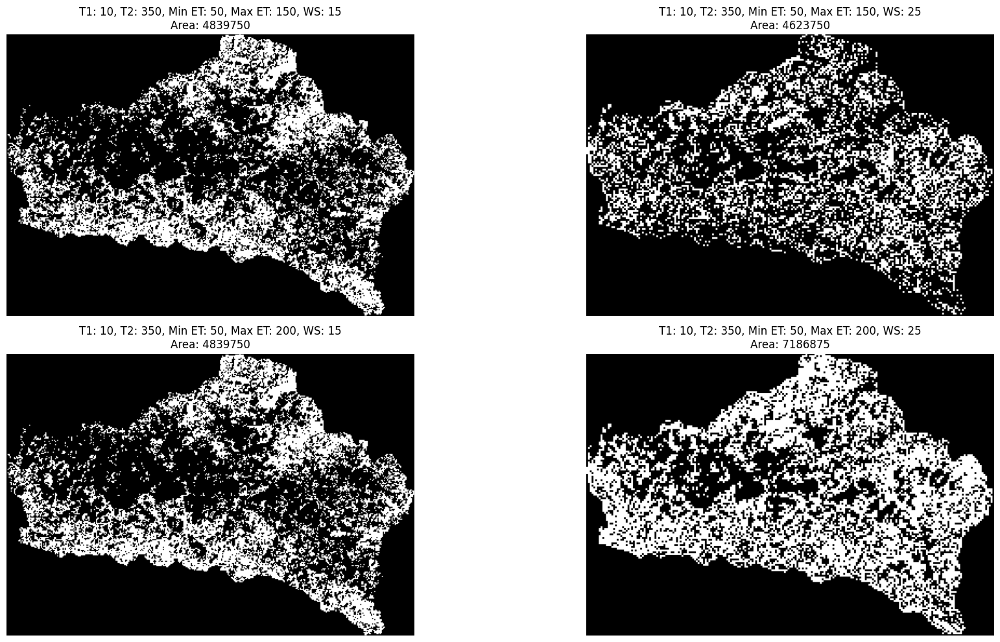

T1: 10, T2: 350, Min ET: 50, Max ET: 400, WS: 25, Area: 8717500 pixels
T1: 10, T2: 350, Min ET: 50, Max ET: 600, WS: 25, Area: 8717500 pixels
T1: 10, T2: 350, Min ET: 100, Max ET: 150, WS: 15, Area: 4725 pixels
T1: 10, T2: 350, Min ET: 100, Max ET: 150, WS: 25, Area: 2487500 pixels


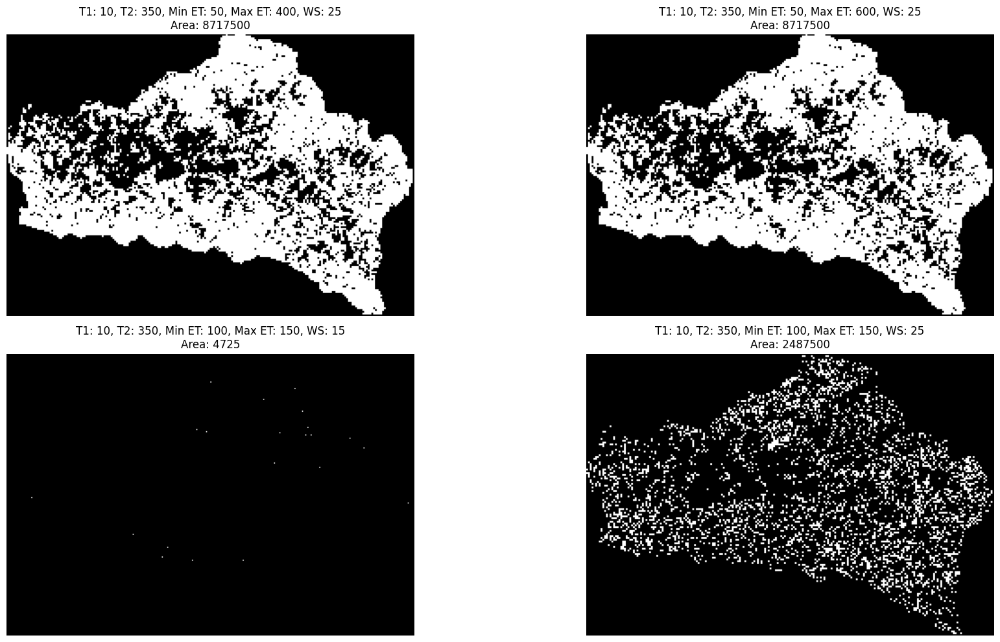

T1: 10, T2: 350, Min ET: 100, Max ET: 200, WS: 15, Area: 4725 pixels
T1: 10, T2: 350, Min ET: 100, Max ET: 200, WS: 25, Area: 5050625 pixels
T1: 10, T2: 350, Min ET: 100, Max ET: 400, WS: 25, Area: 6581250 pixels
T1: 10, T2: 350, Min ET: 100, Max ET: 600, WS: 25, Area: 6581250 pixels


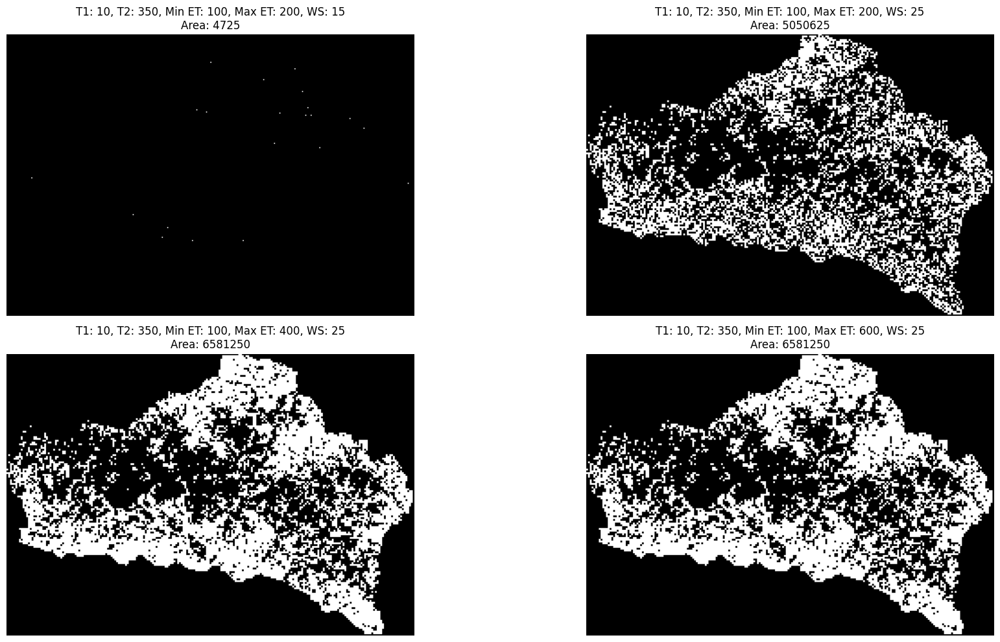

T1: 10, T2: 350, Min ET: 200, Max ET: 400, WS: 25, Area: 1484375 pixels
T1: 10, T2: 350, Min ET: 200, Max ET: 600, WS: 25, Area: 1484375 pixels
T1: 10, T2: 350, Min ET: 300, Max ET: 400, WS: 25, Area: 0 pixels
T1: 10, T2: 350, Min ET: 300, Max ET: 600, WS: 25, Area: 0 pixels


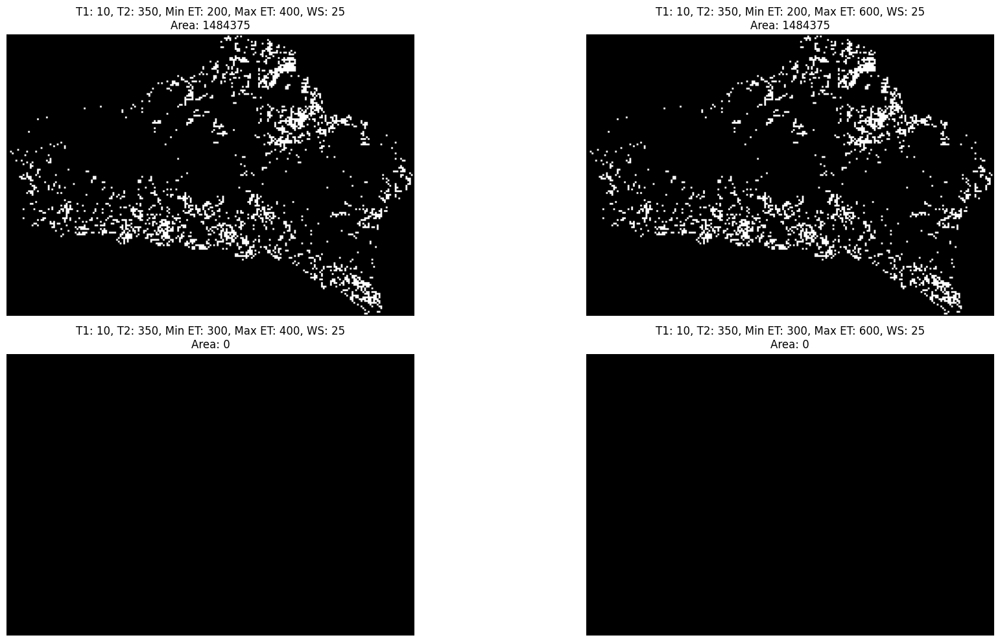

T1: 10, T2: 450, Min ET: 50, Max ET: 100, WS: 15, Area: 3540375 pixels
T1: 10, T2: 450, Min ET: 50, Max ET: 100, WS: 25, Area: 1998125 pixels
T1: 10, T2: 450, Min ET: 50, Max ET: 150, WS: 15, Area: 3548925 pixels
T1: 10, T2: 450, Min ET: 50, Max ET: 150, WS: 25, Area: 4078125 pixels


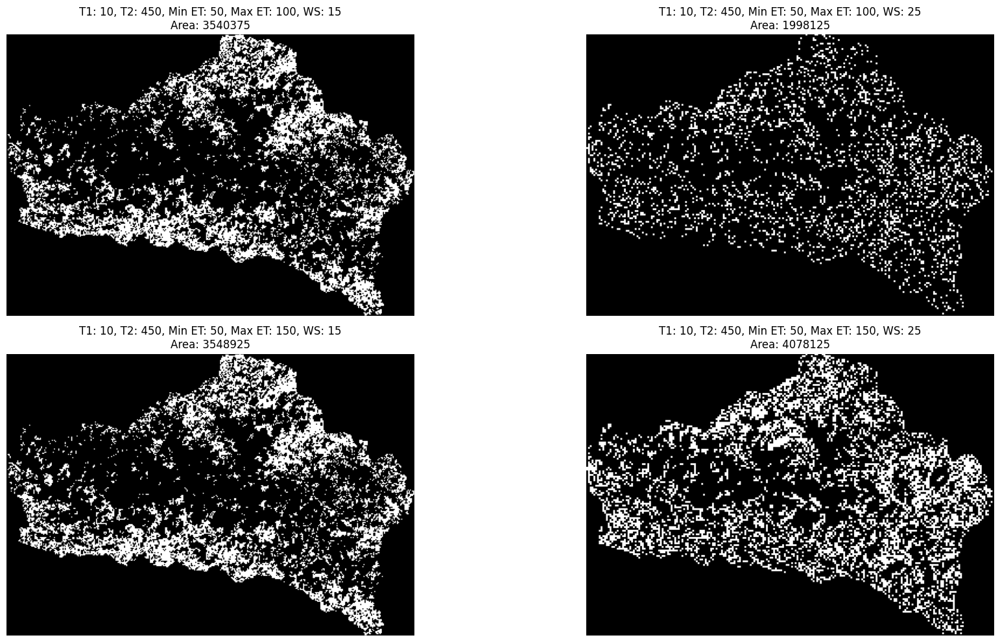

T1: 10, T2: 450, Min ET: 50, Max ET: 200, WS: 15, Area: 3548925 pixels
T1: 10, T2: 450, Min ET: 50, Max ET: 200, WS: 25, Area: 5924375 pixels
T1: 10, T2: 450, Min ET: 50, Max ET: 400, WS: 25, Area: 6953750 pixels
T1: 10, T2: 450, Min ET: 50, Max ET: 600, WS: 25, Area: 6953750 pixels


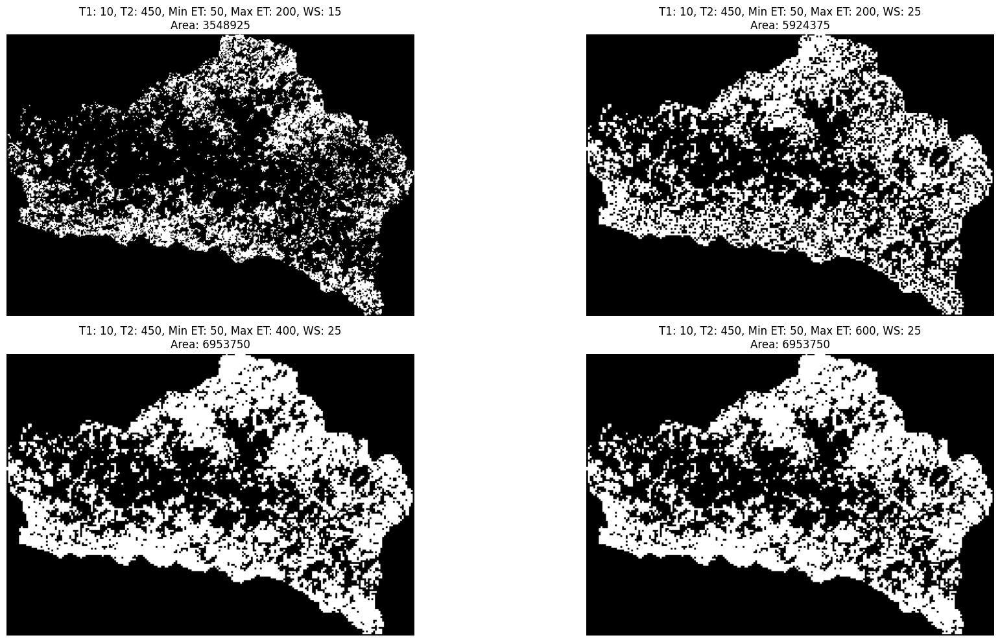

T1: 10, T2: 450, Min ET: 100, Max ET: 150, WS: 15, Area: 3825 pixels
T1: 10, T2: 450, Min ET: 100, Max ET: 150, WS: 25, Area: 2037500 pixels
T1: 10, T2: 450, Min ET: 100, Max ET: 200, WS: 15, Area: 3825 pixels
T1: 10, T2: 450, Min ET: 100, Max ET: 200, WS: 25, Area: 3883750 pixels


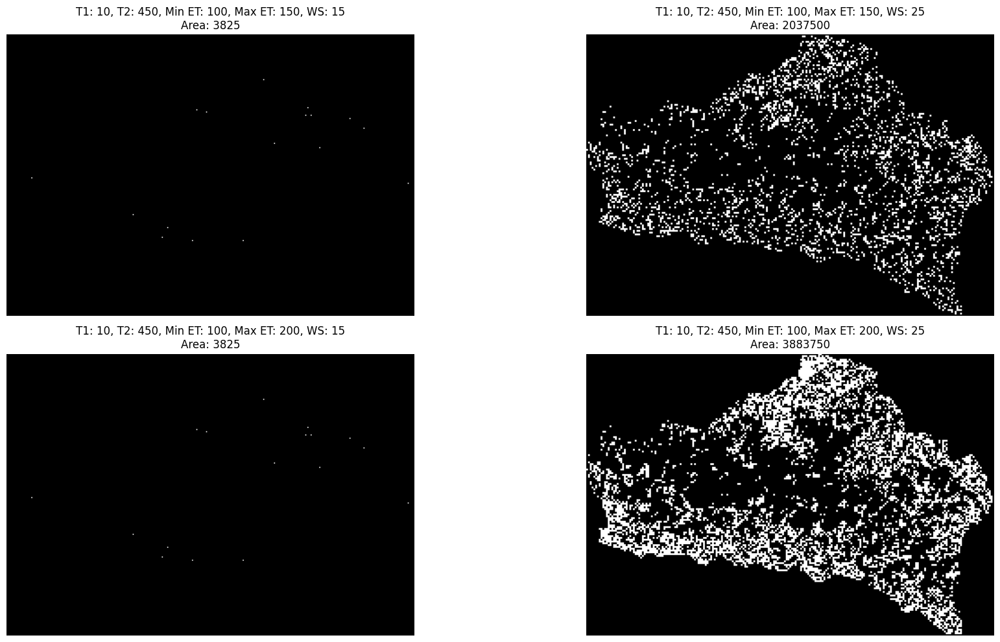

T1: 10, T2: 450, Min ET: 100, Max ET: 400, WS: 25, Area: 4913125 pixels
T1: 10, T2: 450, Min ET: 100, Max ET: 600, WS: 25, Area: 4913125 pixels
T1: 10, T2: 450, Min ET: 200, Max ET: 400, WS: 25, Area: 998750 pixels
T1: 10, T2: 450, Min ET: 200, Max ET: 600, WS: 25, Area: 998750 pixels


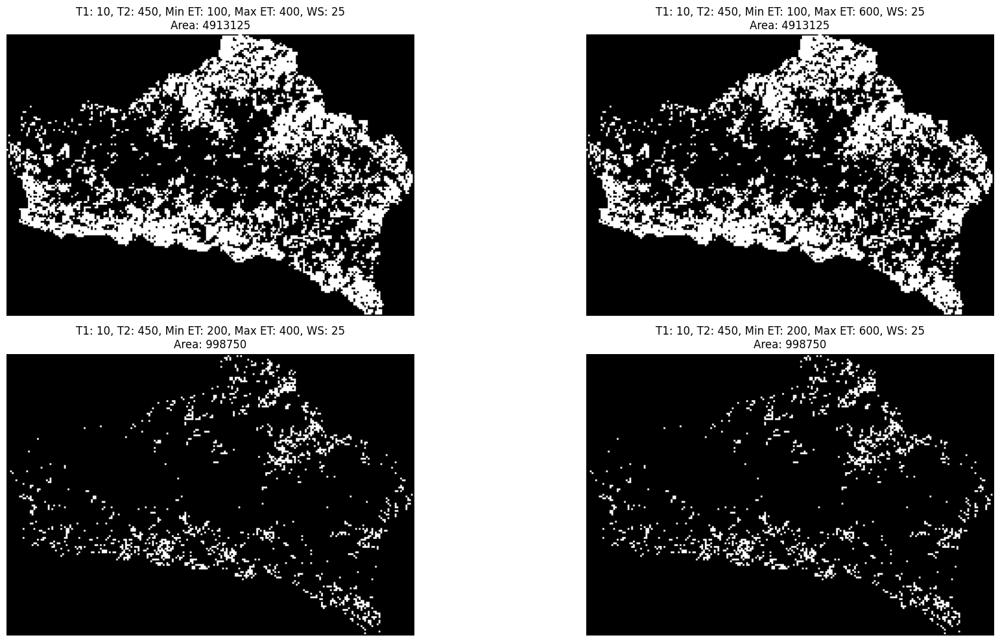

T1: 10, T2: 450, Min ET: 300, Max ET: 400, WS: 25, Area: 0 pixels
T1: 10, T2: 450, Min ET: 300, Max ET: 600, WS: 25, Area: 0 pixels
T1: 10, T2: 550, Min ET: 50, Max ET: 100, WS: 15, Area: 2310975 pixels
T1: 10, T2: 550, Min ET: 50, Max ET: 100, WS: 25, Area: 1671250 pixels


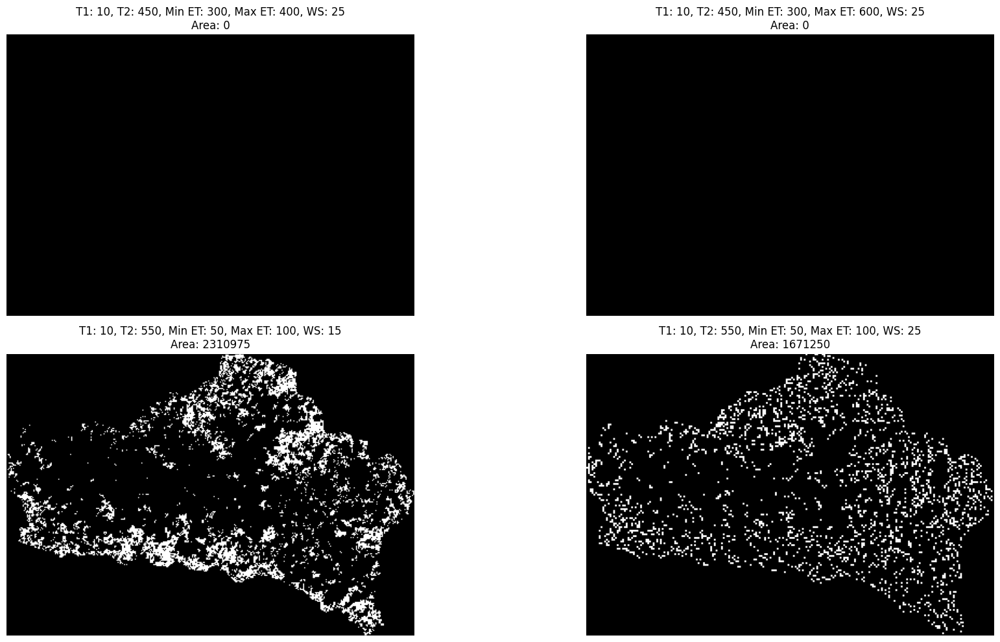

T1: 10, T2: 550, Min ET: 50, Max ET: 150, WS: 15, Area: 2317275 pixels
T1: 10, T2: 550, Min ET: 50, Max ET: 150, WS: 25, Area: 3074375 pixels
T1: 10, T2: 550, Min ET: 50, Max ET: 200, WS: 15, Area: 2317275 pixels
T1: 10, T2: 550, Min ET: 50, Max ET: 200, WS: 25, Area: 4248125 pixels


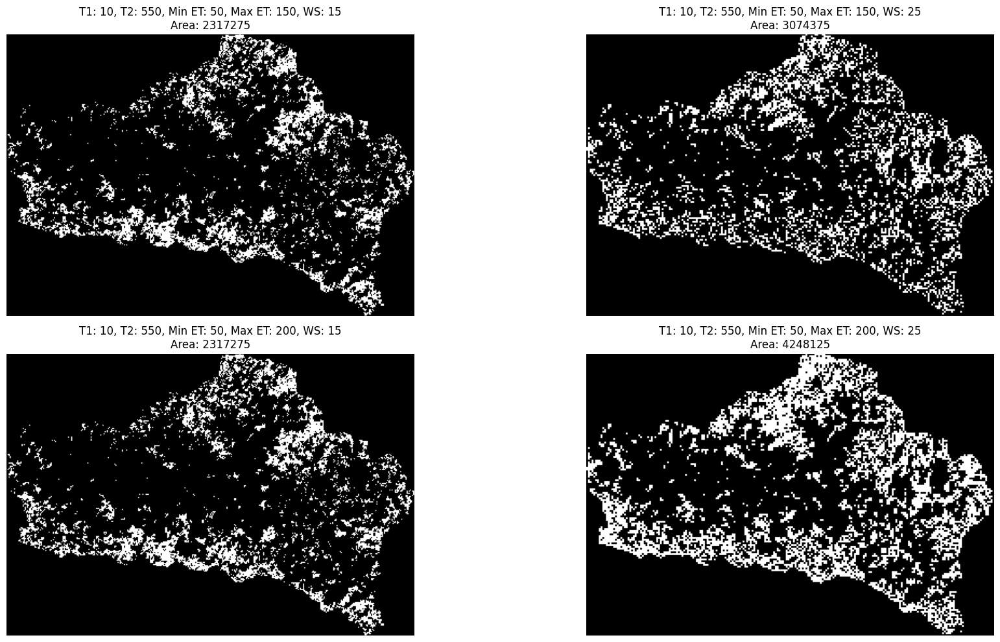

T1: 10, T2: 550, Min ET: 50, Max ET: 400, WS: 25, Area: 4903125 pixels
T1: 10, T2: 550, Min ET: 50, Max ET: 600, WS: 25, Area: 4903125 pixels
T1: 10, T2: 550, Min ET: 100, Max ET: 150, WS: 15, Area: 3600 pixels
T1: 10, T2: 550, Min ET: 100, Max ET: 150, WS: 25, Area: 1366250 pixels


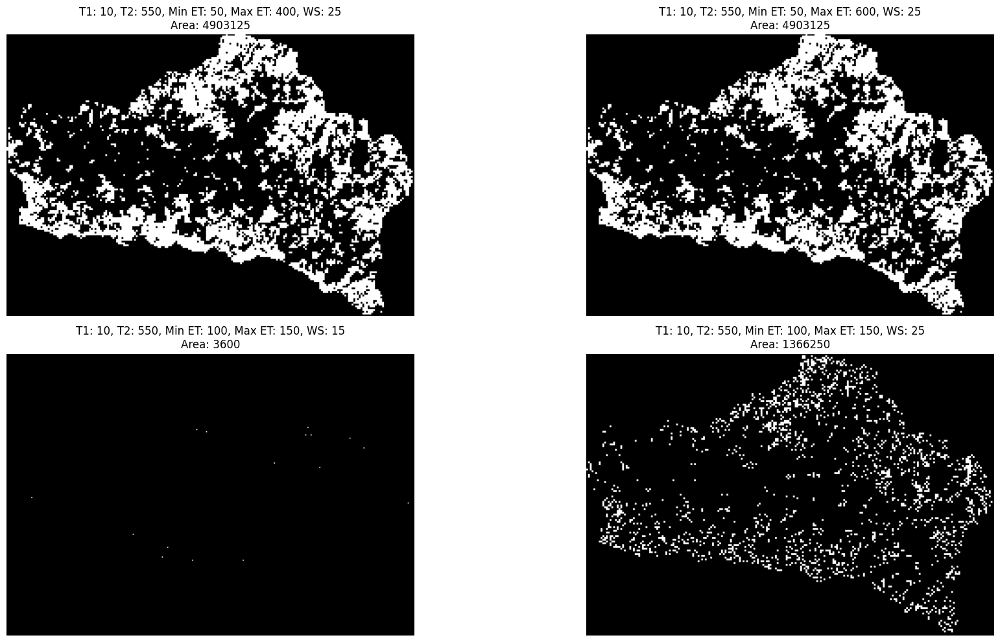

T1: 10, T2: 550, Min ET: 100, Max ET: 200, WS: 15, Area: 3600 pixels
T1: 10, T2: 550, Min ET: 100, Max ET: 200, WS: 25, Area: 2540000 pixels
T1: 10, T2: 550, Min ET: 100, Max ET: 400, WS: 25, Area: 3195000 pixels
T1: 10, T2: 550, Min ET: 100, Max ET: 600, WS: 25, Area: 3195000 pixels


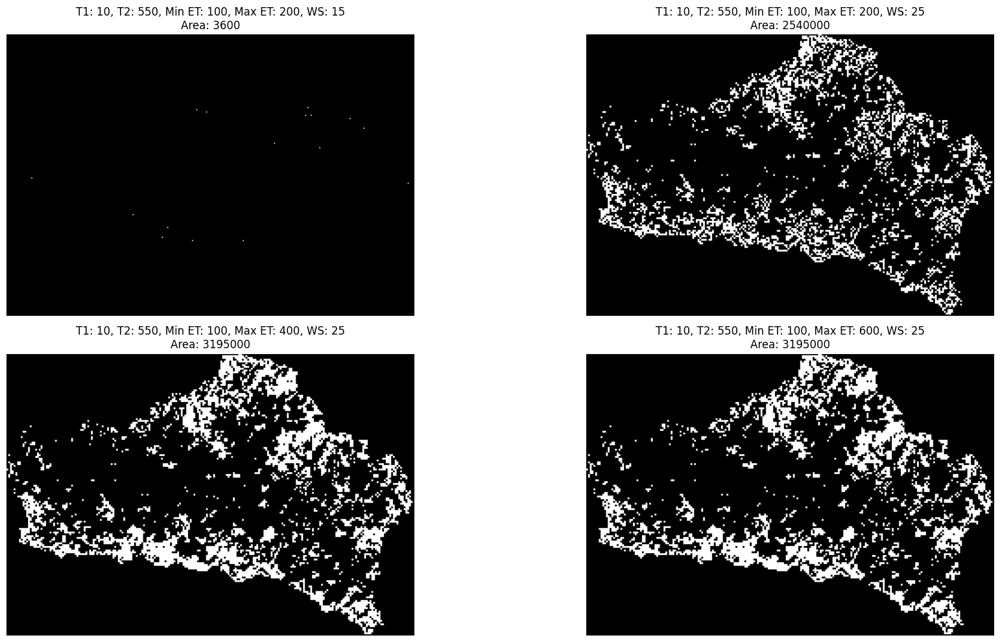

T1: 10, T2: 550, Min ET: 200, Max ET: 400, WS: 25, Area: 637500 pixels
T1: 10, T2: 550, Min ET: 200, Max ET: 600, WS: 25, Area: 637500 pixels
T1: 10, T2: 550, Min ET: 300, Max ET: 400, WS: 25, Area: 0 pixels
T1: 10, T2: 550, Min ET: 300, Max ET: 600, WS: 25, Area: 0 pixels


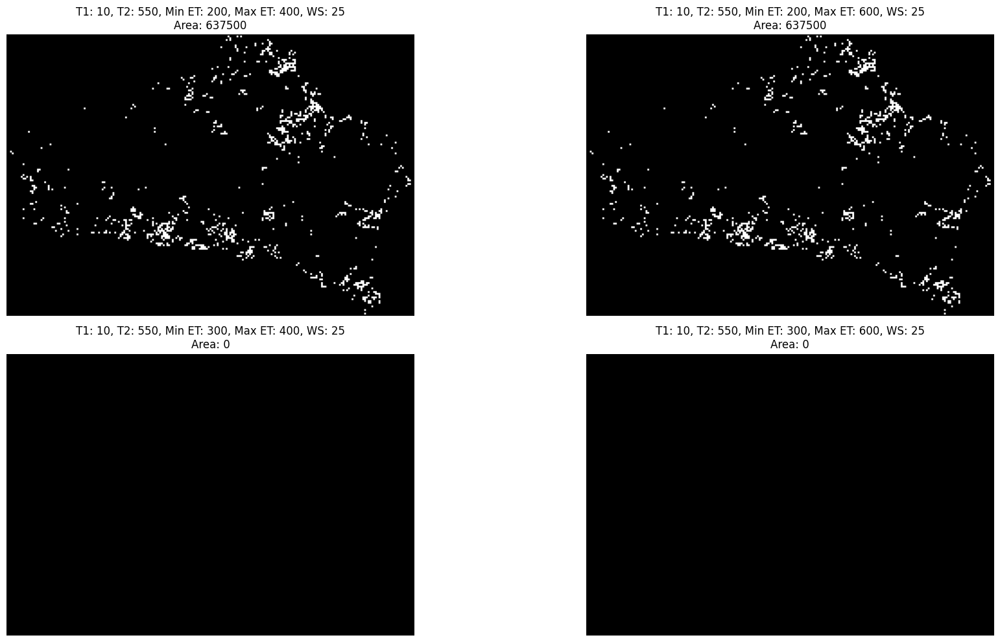

T1: 10, T2: 700, Min ET: 50, Max ET: 100, WS: 15, Area: 2122200 pixels
T1: 10, T2: 700, Min ET: 50, Max ET: 100, WS: 25, Area: 1616875 pixels
T1: 10, T2: 700, Min ET: 50, Max ET: 150, WS: 15, Area: 2127600 pixels
T1: 10, T2: 700, Min ET: 50, Max ET: 150, WS: 25, Area: 2920000 pixels


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Ensure img_array1 is of type uint8
img_array1 = img_array1.astype(np.uint8)

# Function to identify terraces
def identify_terraces(binary_image, window_size, min_edge_threshold, max_edge_threshold):
    terraces = np.zeros_like(binary_image, dtype=np.uint8)
    for i in range(0, binary_image.shape[0] - window_size + 1, window_size):
        for j in range(0, binary_image.shape[1] - window_size + 1, window_size):
            window = binary_image[i:i+window_size, j:j+window_size]
            edge_count = np.sum(window)
            if min_edge_threshold < edge_count < max_edge_threshold:
                terraces[i:i+window_size, j:j+window_size] = 1
    return terraces

# Function to calculate the area of terraces
def calculate_terraces_area(terraces):
    return np.sum(terraces)

# Hyperparameter combinations
threshold1_values = [10, 100, 200, 300, 400, 500]
threshold2_values = [50, 150, 250, 350, 450, 550, 700]
min_edge_threshold_values = [50, 100, 200, 300]
max_edge_threshold_values = [100, 150, 200, 400, 600]
window_size_values = [5,15, 25]

# Maximum edge counts for each window size
max_edge_counts = {5: 5*5, 15: 15*15, 25: 25*25}

# Perform hyperparameter tuning
plot_index = 0
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes = axes.flatten()
img_array1 = rgb2gray(img_array1)
for threshold1 in threshold1_values:
    for threshold2 in threshold2_values:
        if threshold1 > threshold2:
            continue  # Skip invalid combinations
        for min_edge_threshold in min_edge_threshold_values:
            for max_edge_threshold in max_edge_threshold_values:
                if min_edge_threshold >= max_edge_threshold:
                    continue  # Skip invalid combinations
                for window_size in window_size_values:
                    max_edge_count = max_edge_counts[window_size]
                    if min_edge_threshold > max_edge_count or max_edge_threshold > max_edge_count:
                        continue  # Skip impossible combinations
                    img_array1 = rgb2gray(img_array1)
                    # Apply Canny edge detection
                    edges = cv2.Canny(img_array1, threshold1, threshold2)

                    # Convert to binary image
                    binary_image = edges > 0

                    # Identify terraces
                    terraces = identify_terraces(binary_image, window_size, min_edge_threshold, max_edge_threshold)

                    # Calculate the area of terraces
                    terraces_area = calculate_terraces_area(terraces)
                    print(f"T1: {threshold1}, T2: {threshold2}, Min ET: {min_edge_threshold}, Max ET: {max_edge_threshold}, WS: {window_size}, Area: {terraces_area} pixels")

                    # Plot the terraces
                    ax = axes[plot_index % 4]
                    ax.imshow(terraces, cmap='gray')
                    ax.axis('off')
                    ax.set_title(f'T1: {threshold1}, T2: {threshold2}, Min ET: {min_edge_threshold}, Max ET: {max_edge_threshold}, WS: {window_size}\nArea: {terraces_area}')
                    plot_index += 1

                    # Show plot every 4 combinations
                    if plot_index % 4 == 0:
                        plt.tight_layout()
                        plt.show()
                        fig, axes = plt.subplots(2, 2, figsize=(20, 10))
                        axes = axes.flatten()

# Show remaining plots if any
if plot_index % 4 != 0:
    plt.tight_layout()
    plt.show()